# Task 4 — Visual search on real user images

Runs the **saved** Task 4 model against arbitrary photographs in
`A2_FashionDataset/input_images`. Nothing is retrained — this notebook only loads the artefacts
from `05_task4_visual_search-squid.ipynb`.

## The problem this notebook exists to solve

The catalogue is uniform: 60x80 product shots, white background, one item, filling roughly half
the frame. A user's upload is none of those things. Because the encoder pools over the whole
image, **the background is part of the embedding** — a dress photographed against a street is
partly encoded as "street", which corrupts both the predicted item type and, especially, the
colour.

Three preprocessing strategies are therefore compared:

| Mode | What it does | Weakness |
|---|---|---|
| `letterbox` | pad to 3:4, resize | keeps the whole background; a wide photo leaves the garment small |
| `crop` | centre-crop to 3:4, resize | trims the frame edges, but keeps whatever is behind the subject |
| `nobg` | segment the subject, place on white, crop tight, pad, resize | segmentation can fail on light items against light backgrounds |

`nobg` tries **rembg** first (a learned matting model, much better on white-on-white products),
falls back to **OpenCV GrabCut**, then to flood fill. Every mask is sanity-checked: if the
result would delete the product, it reverts to `crop` rather than returning a blank image.

For the best cutouts:

```
pip install rembg
```

It downloads a ~176 MB model on first use. Without it the classical fallbacks still run.

**No mode is universally best**, which is why this notebook measures all three on your own
images rather than assuming.

## 1. Setup

In [1]:
# ============================================
# CELL 1 - Imports and paths
# ============================================

import sys
import json
import time
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

NOTEBOOK_DIR = Path.cwd()
PROJECT_DIR = NOTEBOOK_DIR.parent
sys.path.insert(0, str(PROJECT_DIR))          # so `src` is importable

from src.visual_search.search_engine import (
    SearchEngine, load_user_image, list_images, PREPROCESS_MODES, foreground_mask,
)

INPUT_DIR = PROJECT_DIR / "A2_FashionDataset" / "input_images"
ARTIFACT_DIR = PROJECT_DIR / "artifacts" / "task4"
OUTPUT_DIR = PROJECT_DIR / "outputs"
OUTPUT_DIR.mkdir(exist_ok=True)

print("Input folder:", INPUT_DIR)
print("Modes available:", PREPROCESS_MODES)
assert INPUT_DIR.exists(), f"Cannot find {INPUT_DIR}"
assert (ARTIFACT_DIR / "search_manifest.json").exists(), (
    "Artefacts missing - run the final cells of 05_task4_visual_search-squid.ipynb"
)

try:
    import rembg                                   # noqa: F401
    print("rembg: installed (best-quality cutouts)")
except ImportError:
    print("rembg: NOT installed - falling back to OpenCV GrabCut / flood fill")
    print("       pip install rembg   for noticeably better segmentation")

Input folder: c:\Users\LEGION\Documents\jupyter_notebook\Fashion-Intelligence-System\A2_FashionDataset\input_images
Modes available: ('letterbox', 'crop', 'nobg')
rembg: NOT installed - falling back to OpenCV GrabCut / flood fill
       pip install rembg   for noticeably better segmentation


In [2]:
# ============================================
# CELL 2 - Load the saved search engine
# ============================================

engine = SearchEngine.load(ARTIFACT_DIR)

print("Model        :", engine.manifest["best_method"])
print("Catalogue    :", f"{len(engine.metadata):,} items")
print("Embedding dim:", engine.index.shape[1])
print("Input size   :", engine.size, "(W x H)")
print("Device       :", engine.device)

metrics = engine.manifest.get("deployment_metrics", {})
if metrics:
    print("\nMeasured on held-out CATALOGUE-STYLE products:")
    print(f"  P@10      {metrics['P@10'] * 100:.2f}%")
    print(f"  colour@10 {metrics['colour@10'] * 100:.2f}%")
    print(f"  both@10   {metrics['both@10'] * 100:.2f}%")
    print("\nThese figures do NOT transfer to the images below: those were flat-lay")
    print("catalogue shots, these are photographs from the open web.")

Model        : Improved+TTA+bgaug
Catalogue    : 32,837 items
Embedding dim: 128
Input size   : (60, 80) (W x H)
Device       : cuda

Measured on held-out CATALOGUE-STYLE products:
  P@10      79.68%
  colour@10 53.32%
  both@10   42.48%

These figures do NOT transfer to the images below: those were flat-lay
catalogue shots, these are photographs from the open web.


In [3]:
# ============================================
# CELL 3 - Inventory the input folder
# ============================================

query_paths = list_images(INPUT_DIR)
print(f"Readable images: {len(query_paths)}\n")

rows = []
for path in query_paths:
    try:
        with Image.open(path) as img:
            rows.append({"file": path.name[:38], "format": img.format,
                         "size": f"{img.width}x{img.height}", "mode": img.mode,
                         "aspect": round(img.width / img.height, 2)})
    except Exception as error:
        rows.append({"file": path.name[:38], "format": "UNREADABLE", "size": "-",
                     "mode": type(error).__name__, "aspect": np.nan})

inventory = pd.DataFrame(rows)
display(inventory)
print("Formats:", dict(inventory["format"].value_counts()))
print("\nCatalogue aspect ratio is 0.75 (60x80). Values far from that are the ones")
print("most distorted by naive resizing.")

unreadable = inventory[inventory["format"] == "UNREADABLE"]
if len(unreadable):
    display(unreadable)
    print("If these are .avif:  pip install pillow-avif-plugin")
    query_paths = [p for p in query_paths if p.name[:38] not in set(unreadable["file"])]

Readable images: 19



,file,format,size,mode,aspect
0,1017_women_0023_a36fe2486db54e83b62813,WEBP,1365x2048,RGB,0.67
1,2b3f6ff00db7a1efae21d85cfb8995eaff2da8,PNG,630x630,P,1.00
2,3-Stripes_High_Crew_Socks_3_Pairs_Whit,AVIF,500x500,RGB,1.00
3,4130636080047_004_b14.webp,WEBP,349x523,RGB,0.67
4,509.png,PNG,475x475,RGBA,1.00
5,600_google-pattern-socks.jpg,JPEG,600x600,RGB,1.00
6,Afternoon_ensemble_MET_63.212a-b_CP4.j,JPEG,2746x3840,RGB,0.72
7,Collier_ruban_or_vermeil_2.webp,WEBP,2932x2932,RGB,1.00
8,d8ff992811e561202194328c9562a843.jpg,JPEG,1200x1598,RGB,0.75
9,giay-local-brand-viet-nam_b140845b-6e6,WEBP,1000x1000,RGB,1.00


Formats: {'JPEG': np.int64(12), 'WEBP': np.int64(4), 'PNG': np.int64(2), 'AVIF': np.int64(1)}

Catalogue aspect ratio is 0.75 (60x80). Values far from that are the ones
most distorted by naive resizing.


## 2. What the model actually sees

The single most useful diagnostic in this notebook. If an image looks mangled here — product
deleted, background dominating, proportions squashed — retrieval was never going to work, and
the fault is in preprocessing rather than the model.

In [4]:
# ============================================
# CELL 4 - Compare the three preprocessing modes
# ============================================

prepared = {mode: [] for mode in PREPROCESS_MODES}
prep_info = []

for path in query_paths:
    for mode in PREPROCESS_MODES:
        array, info = load_user_image(path, engine.size, mode=mode, return_info=True)
        prepared[mode].append(array)
        if mode == "nobg":
            prep_info.append({
                "file": path.name[:34],
                "segmentation": info["method"],
                "foreground%": round(info["foreground_fraction"] * 100, 1),
                "subject_fill%": round(info["ink_fraction"] * 100, 1),
                "reverted": info["fell_back"],
            })

prep_table = pd.DataFrame(prep_info)
display(prep_table)

reverted = prep_table[prep_table["reverted"]]
if len(reverted):
    print(f"{len(reverted)} image(s) reverted to `crop` because segmentation would have")
    print("removed the product itself:", list(reverted["file"]))

,file,segmentation,foreground%,subject_fill%,reverted
0,1017_women_0023_a36fe2486db54e83b6,grabcut+core,35.2,40.6,False
1,2b3f6ff00db7a1efae21d85cfb8995eaff,grabcut+core,31.7,27.7,False
2,3-Stripes_High_Crew_Socks_3_Pairs_,grabcut+core,48.2,45.9,False
3,4130636080047_004_b14.webp,grabcut+core,32.8,31.8,False
4,509.png,grabcut+core,27.5,34.9,False
5,600_google-pattern-socks.jpg,grabcut+core,38.7,23.6,False
6,Afternoon_ensemble_MET_63.212a-b_C,grabcut+core,39.6,39.4,False
7,Collier_ruban_or_vermeil_2.webp,grabcut+core,45.7,36.0,False
8,d8ff992811e561202194328c9562a843.j,grabcut+core,41.5,44.5,False
9,giay-local-brand-viet-nam_b140845b,grabcut+core,50.5,52.1,False


1 image(s) reverted to `crop` because segmentation would have
removed the product itself: ['images (5).jpg']


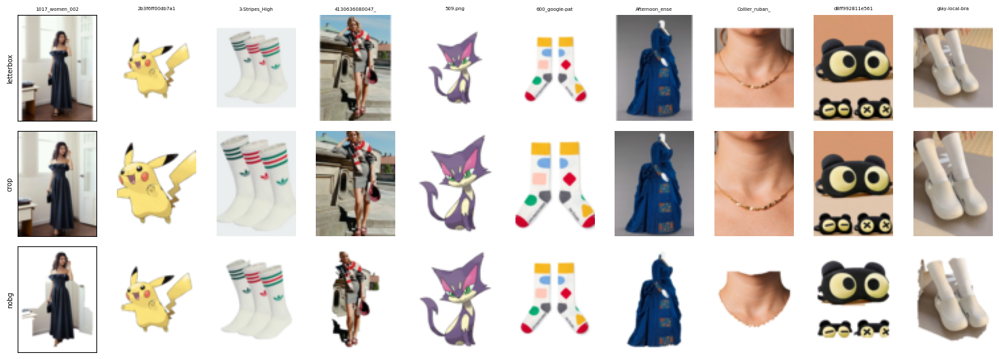

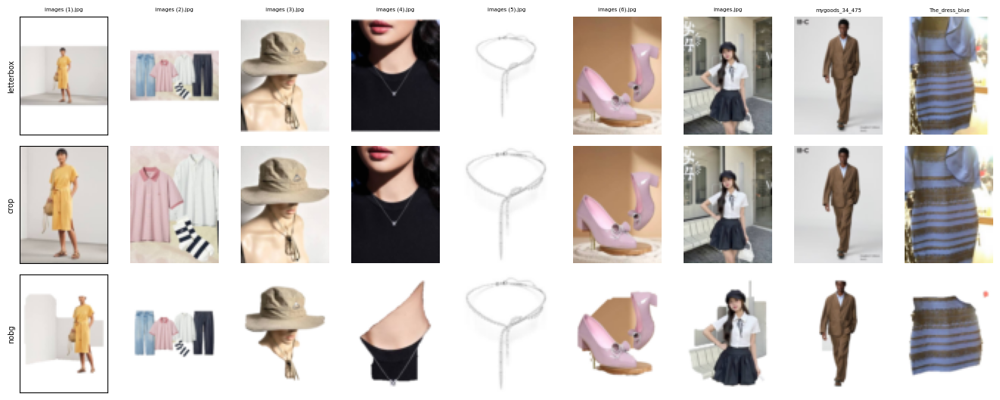

Row 1 letterbox   Row 2 crop   Row 3 background removed
Look for: is the garment recognisable, roughly centred, and on white?


In [5]:
# ============================================
# CELL 5 - Visual side-by-side of the three modes
# ============================================

columns = 10
for block in range(0, len(query_paths), columns):
    chunk = query_paths[block:block + columns]
    fig, axes = plt.subplots(3, len(chunk), figsize=(1.5 * len(chunk), 5.4),
                             squeeze=False)
    for column, path in enumerate(chunk):
        index = block + column
        for row, mode in enumerate(PREPROCESS_MODES):
            axes[row][column].imshow(prepared[mode][index])
            axes[row][column].axis("off")
            if column == 0:
                axes[row][column].set_ylabel(mode)
        axes[0][column].set_title(path.name[:14], fontsize=5)
    for row, mode in enumerate(PREPROCESS_MODES):
        axes[row][0].axis("on")
        axes[row][0].set_xticks([]); axes[row][0].set_yticks([])
        axes[row][0].set_ylabel(mode, fontsize=7)
    plt.tight_layout()
    plt.show()

print("Row 1 letterbox   Row 2 crop   Row 3 background removed")
print("Look for: is the garment recognisable, roughly centred, and on white?")

## 3. A/B test the modes

The same queries are run through all three pipelines. There is no ground truth for these
images, so two proxies stand in:

* **Top-1 similarity** — how close the nearest catalogue item is.
* **Coherence** — how many distinct `articleType`s appear in the top 8. A query that lands in a
  meaningful region returns one kind of item; a confused one returns eight different kinds.

Neither proves correctness. **Judge the pictures in Cell 8 first** and use these numbers as
supporting evidence, not as the decision.

In [6]:
# ============================================
# CELL 6 - Search with every mode
# ============================================

TOP_K = 8
results_by_mode = {}

for mode in PREPROCESS_MODES:
    start = time.time()
    results_by_mode[mode] = engine.search(query_paths, k=TOP_K, mode=mode)
    print(f"{mode:10s} {len(query_paths)} queries in {time.time() - start:.1f}s")

all_results = pd.concat(results_by_mode.values(), ignore_index=True)
print("\nRows:", len(all_results))

letterbox  19 queries in 1.1s
crop       19 queries in 0.8s
nobg       19 queries in 41.7s

Rows: 456


,mode,mean_top1_similarity,mean_distinct_types,mean_agreement(of 8),queries_with_1_type
0,letterbox,0.6567,2.68,5.89,8
1,crop,0.6635,3.11,5.32,6
2,nobg,0.6673,3.11,4.63,1


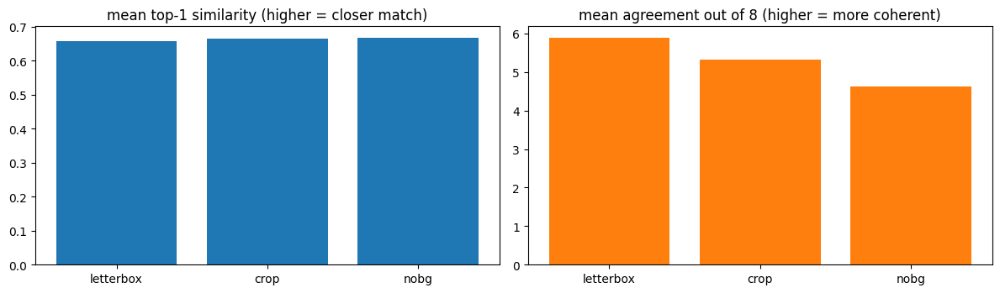

Higher similarity with higher agreement suggests a better pipeline.
High similarity with LOW agreement is a warning sign: the query landed
somewhere dense but meaningless.


In [7]:
# ============================================
# CELL 7 - Which mode looks healthiest?
# ============================================

rows = []
for mode, frame in results_by_mode.items():
    per_query = []
    for path in query_paths:
        matches = frame[frame["query"] == path.name]
        dominant = matches["articleType"].mode().iloc[0]
        per_query.append({
            "top_similarity": matches.iloc[0]["similarity"],
            "distinct_types": matches["articleType"].nunique(),
            "agreement": (matches["articleType"] == dominant).sum(),
        })
    per_query = pd.DataFrame(per_query)
    rows.append({
        "mode": mode,
        "mean_top1_similarity": round(per_query["top_similarity"].mean(), 4),
        "mean_distinct_types": round(per_query["distinct_types"].mean(), 2),
        "mean_agreement(of 8)": round(per_query["agreement"].mean(), 2),
        "queries_with_1_type": int((per_query["distinct_types"] == 1).sum()),
    })

mode_table = pd.DataFrame(rows)
display(mode_table)

fig, axes = plt.subplots(1, 2, figsize=(12, 3.6))
axes[0].bar(mode_table["mode"], mode_table["mean_top1_similarity"], color="tab:blue")
axes[0].set_title("mean top-1 similarity (higher = closer match)")
axes[1].bar(mode_table["mode"], mode_table["mean_agreement(of 8)"], color="tab:orange")
axes[1].set_title("mean agreement out of 8 (higher = more coherent)")
plt.tight_layout(); plt.show()

print("Higher similarity with higher agreement suggests a better pipeline.")
print("High similarity with LOW agreement is a warning sign: the query landed")
print("somewhere dense but meaningless.")

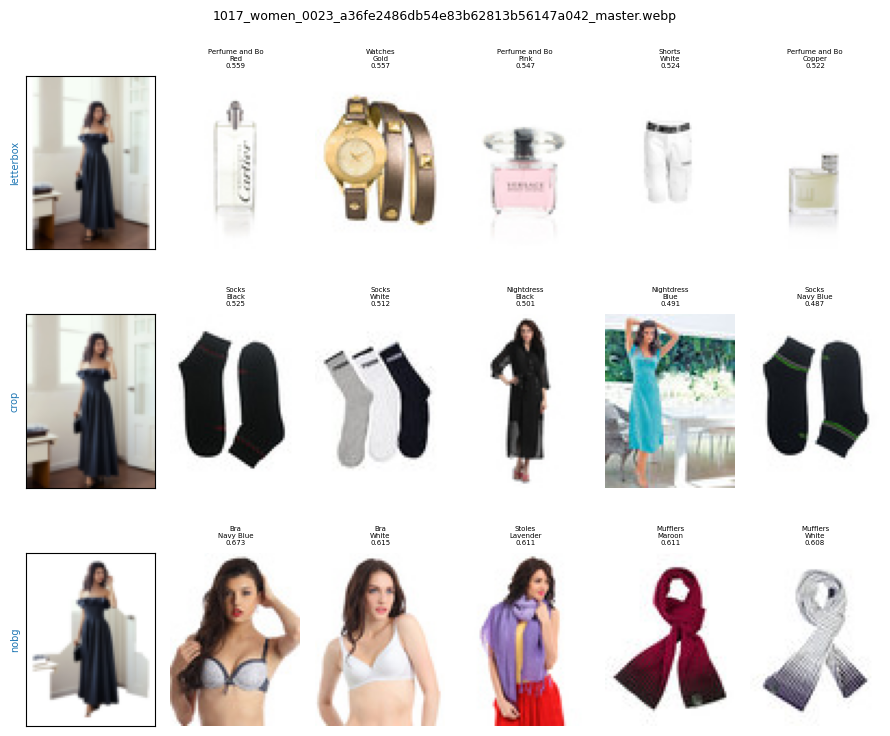

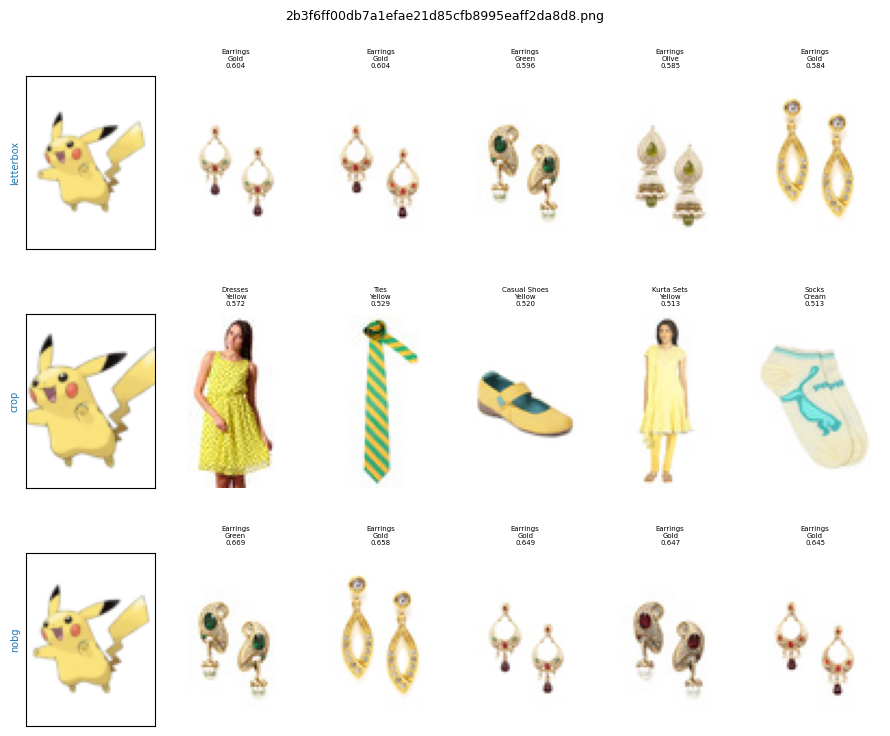

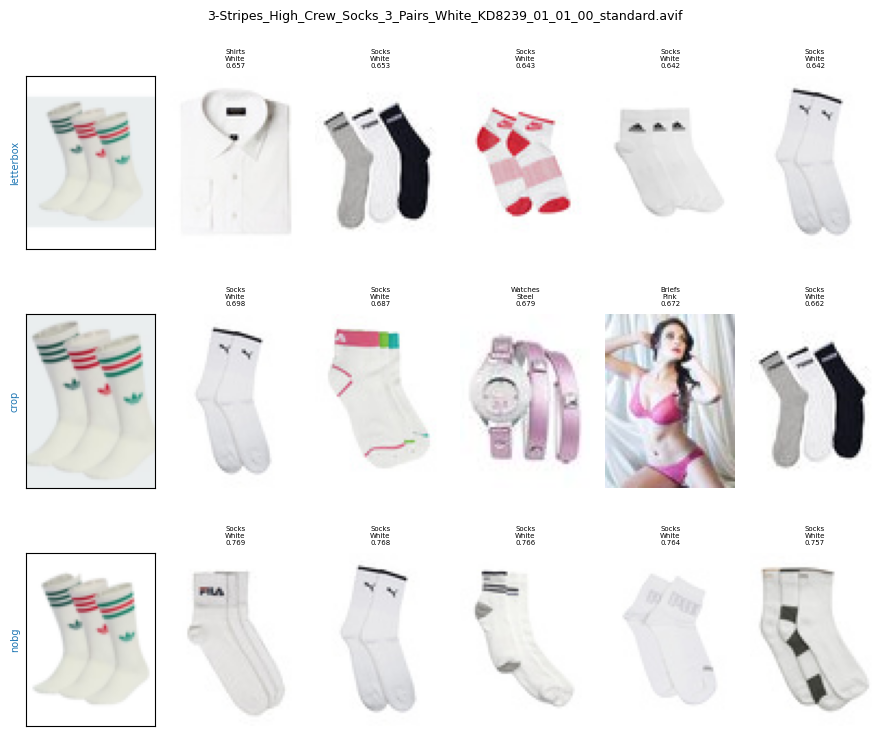

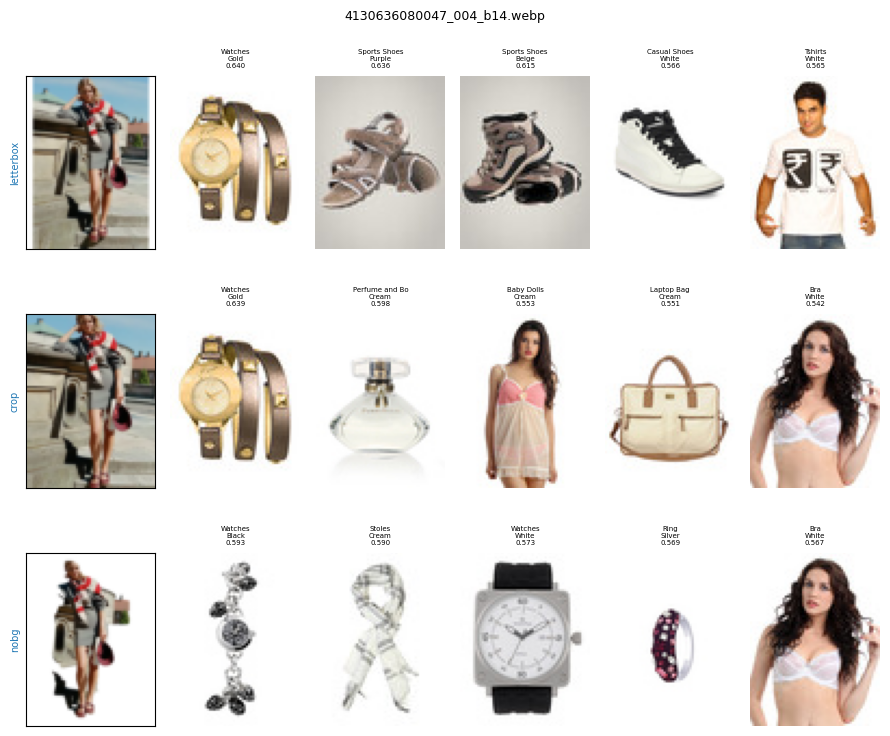

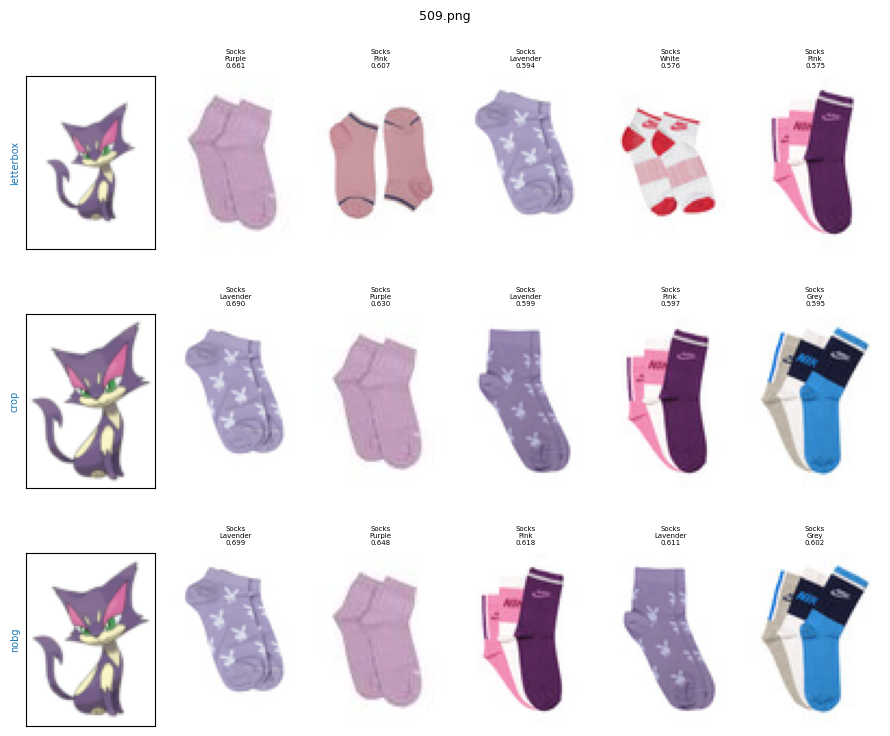

...

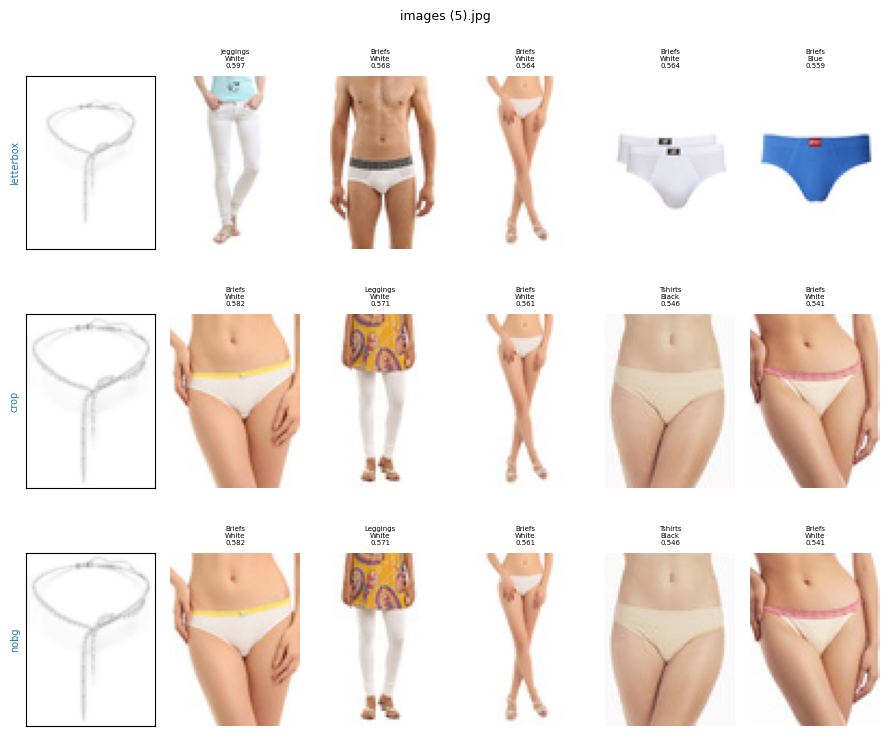

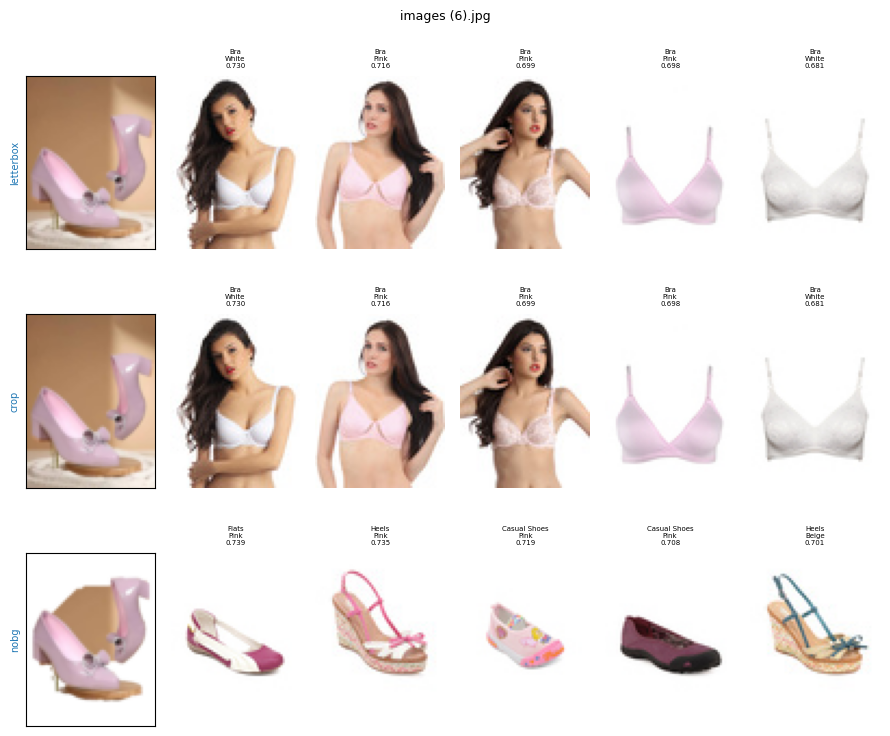

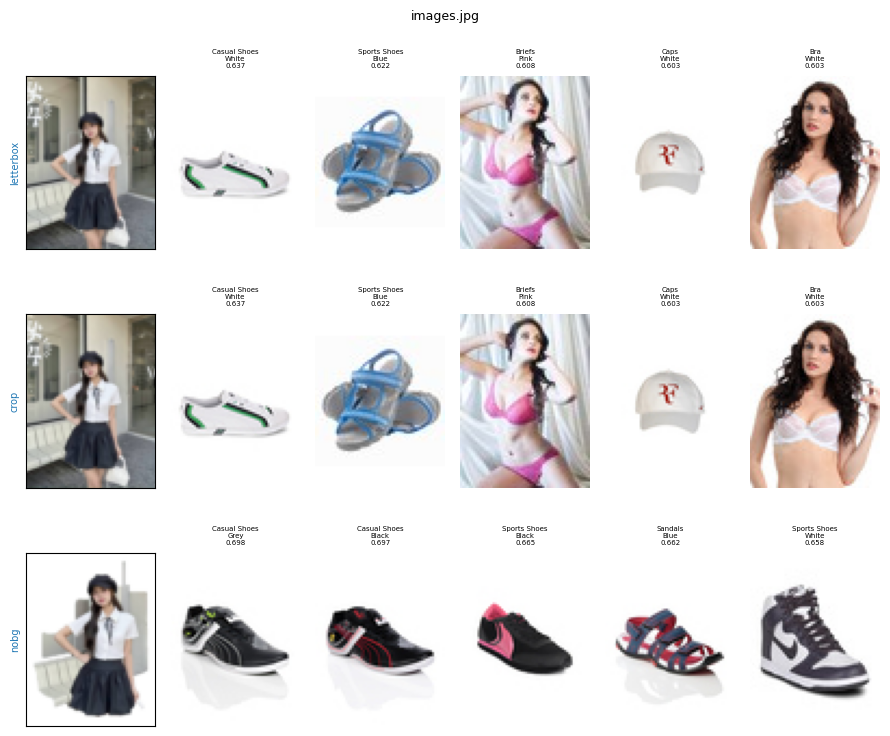

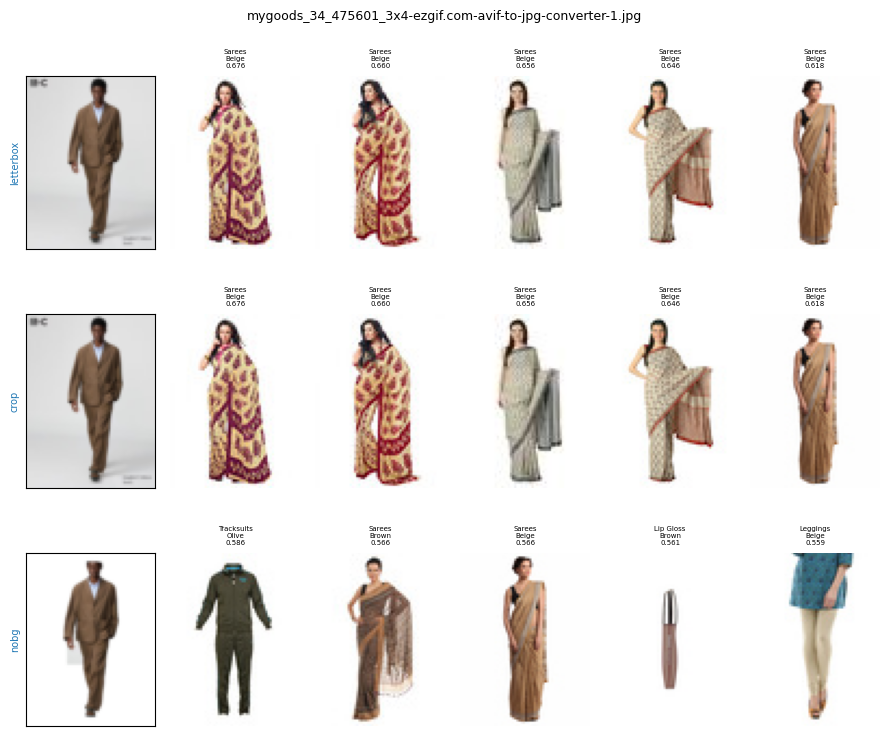

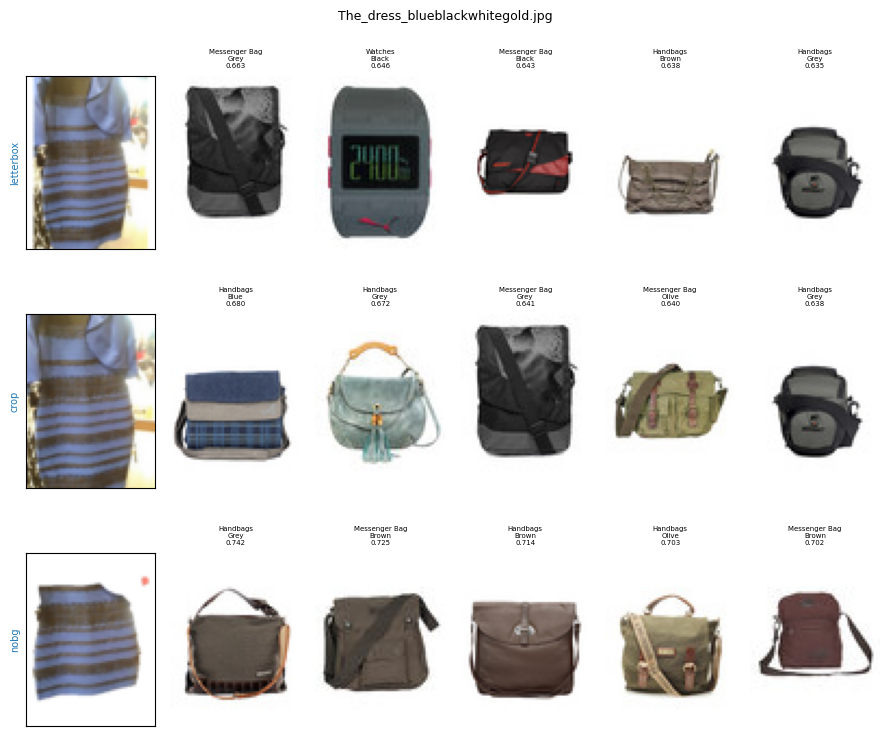

In [8]:
# ============================================
# CELL 8 - Per-image A/B: the same query under all three modes
# ============================================

catalogue_cache = {}


def catalogue_thumbnail(row):
    path = row["image_path"]
    if path not in catalogue_cache:
        try:
            catalogue_cache[path] = load_user_image(path, engine.size, mode="letterbox")
        except Exception:
            catalogue_cache[path] = np.full((engine.size[1], engine.size[0], 3),
                                            220, dtype=np.uint8)
    return catalogue_cache[path]


SHOW = 5          # results per mode; raise to inspect more

for index, path in enumerate(query_paths):
    fig, axes = plt.subplots(len(PREPROCESS_MODES), SHOW + 1,
                             figsize=(1.5 * (SHOW + 1), 2.6 * len(PREPROCESS_MODES)))
    for row, mode in enumerate(PREPROCESS_MODES):
        matches = results_by_mode[mode]
        matches = matches[matches["query"] == path.name].reset_index(drop=True)

        axes[row][0].imshow(prepared[mode][index])
        axes[row][0].set_xticks([]); axes[row][0].set_yticks([])
        axes[row][0].set_ylabel(mode, fontsize=7, color="tab:blue")

        for slot in range(SHOW):
            item = matches.iloc[slot]
            axes[row][slot + 1].imshow(catalogue_thumbnail(item))
            axes[row][slot + 1].axis("off")
            axes[row][slot + 1].set_title(
                f"{item['articleType'][:14]}\n{item['baseColour']}\n"
                f"{item['similarity']:.3f}", fontsize=5)

    fig.suptitle(f"{path.name}", fontsize=9)
    plt.tight_layout()
    plt.show()

## 4. Choose a mode and produce the final results

Set `PREFERRED_MODE` from what you saw above. If the three look equally poor for a given image,
that image is simply outside what a 60x80 model trained on flat-lay catalogue photos can handle
— worth saying so in the report rather than tuning until it looks acceptable.

In [9]:
# ============================================
# CELL 9 - Final results with the chosen mode
# ============================================

PREFERRED_MODE = "nobg"          # <- change after inspecting Cells 5 and 8

results = results_by_mode[PREFERRED_MODE]

summary_rows = []
for path in query_paths:
    matches = results[results["query"] == path.name]
    dominant = matches["articleType"].mode().iloc[0]
    summary_rows.append({
        "file": path.name[:34],
        "top_match": matches.iloc[0]["articleType"],
        "top_colour": matches.iloc[0]["baseColour"],
        "top_similarity": round(matches.iloc[0]["similarity"], 3),
        "agreement": f"{(matches['articleType'] == dominant).sum()}/{len(matches)}",
        "distinct_types": matches["articleType"].nunique(),
    })

summary = pd.DataFrame(summary_rows).sort_values("top_similarity", ascending=False)

# A query is only shown to a user when the nearest item is close AND the
# results agree with each other. Tune both on your own data.
SIMILARITY_THRESHOLD = 0.60
AGREEMENT_THRESHOLD = 4

summary["accepted"] = [
    (row["top_similarity"] >= SIMILARITY_THRESHOLD
     and int(row["agreement"].split("/")[0]) >= AGREEMENT_THRESHOLD)
    for _, row in summary.iterrows()
]
display(summary)

print(f"Mode: {PREFERRED_MODE} | accepted {int(summary['accepted'].sum())}/{len(summary)}")
print("Rejected queries would show 'no close match' rather than ten irrelevant items.")

,file,top_match,top_colour,top_similarity,agreement,distinct_types,accepted
2,3-Stripes_High_Crew_Socks_3_Pairs_,Socks,White,0.769,8/8,1,True
18,The_dress_blueblackwhitegold.jpg,Handbags,Grey,0.742,5/8,3,True
7,Collier_ruban_or_vermeil_2.webp,Briefs,Skin,0.739,4/8,2,True
15,images (6).jpg,Flats,Pink,0.739,3/8,4,False
6,Afternoon_ensemble_MET_63.212a-b_C,Lehenga Choli,Blue,0.725,3/8,4,False
13,images (4).jpg,Handbags,Black,0.710,4/8,3,True
4,509.png,Socks,Lavender,0.699,7/8,2,True
16,images.jpg,Casual Shoes,Grey,0.698,4/8,3,True
0,1017_women_0023_a36fe2486db54e83b6,Bra,Navy Blue,0.673,3/8,3,False
1,2b3f6ff00db7a1efae21d85cfb8995eaff,Earrings,Green,0.669,7/8,2,True


Mode: nobg | accepted 11/19
Rejected queries would show 'no close match' rather than ten irrelevant items.


In [10]:
# ============================================
# CELL 10 - Save
# ============================================

all_results.to_csv(OUTPUT_DIR / "user_image_search_all_modes.csv", index=False)
results.to_csv(OUTPUT_DIR / "user_image_search_results.csv", index=False)
summary.to_csv(OUTPUT_DIR / "user_image_search_summary.csv", index=False)
mode_table.to_csv(OUTPUT_DIR / "preprocessing_mode_comparison.csv", index=False)
prep_table.to_csv(OUTPUT_DIR / "segmentation_report.csv", index=False)

print("Saved to", OUTPUT_DIR)
for name in ["user_image_search_all_modes.csv", "user_image_search_results.csv",
             "user_image_search_summary.csv", "preprocessing_mode_comparison.csv",
             "segmentation_report.csv"]:
    print("  ", name)

Saved to c:\Users\LEGION\Documents\jupyter_notebook\Fashion-Intelligence-System\outputs
   user_image_search_all_modes.csv
   user_image_search_results.csv
   user_image_search_summary.csv
   preprocessing_mode_comparison.csv
   segmentation_report.csv


## 5. Interpreting the results

**If background removal helps**, that is a finding worth reporting: it shows the embedding was
partly describing the background, which is a direct consequence of global average pooling over
the whole image.

**If it barely helps**, the limitation is elsewhere, and the honest conclusion is that the
domain gap is too wide for preprocessing alone to close:

* **Resolution.** 60x80 pixels. Fabric, print and subtle colour differences do not survive.
* **Pose and context.** The catalogue is flat-lay; a worn garment has a different silhouette,
  and the model never saw a person.
* **Multiple items.** One embedding per image cannot represent a rack of five garments.
* **Out-of-domain inputs.** Cartoons and non-clothing images have no correct answer, and the
  system has no reject option — which is what the confidence rule in Cell 9 is for.

### The honest framing for the report

The reported 81% P@10 / 46% both@10 was measured on held-out **catalogue** products. These
uploads come from a different distribution, and performance drops accordingly. That gap is a
legitimate finding about deployment, not a defect to conceal.

### Ranked next steps

1. **Garment detection before embedding.** Detect and crop the clothing region, then search.
   This is the principled version of what `nobg` approximates and would help most.
2. **Train with background augmentation.** Composite catalogue items onto random backgrounds
   during training so the encoder learns to ignore them.
3. **Higher resolution.** The catalogue images exist at higher resolution upstream; 60x80 was
   chosen for training speed, not from necessity.